In [4]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt

# Load your CVD prevalence data
data_path = 'cvd_prev.csv'  # Update this to your file path
cvd_data = pd.read_csv(data_path)

# Load the county boundaries
# This assumes you have a GeoJSON or Shapefile for U.S. counties. One source for such data is the U.S. Census Bureau.
geo_data_path = 'cb_2018_us_county_500k/cb_2018_us_county_500k.shp'  # Update this path
counties = gpd.read_file(geo_data_path)


merged = counties.merge(cvd_data, left_on='NAME', right_on='Location')

# Plotting


Text(0.5, 1.0, 'CVD Prevalence Rate by County')

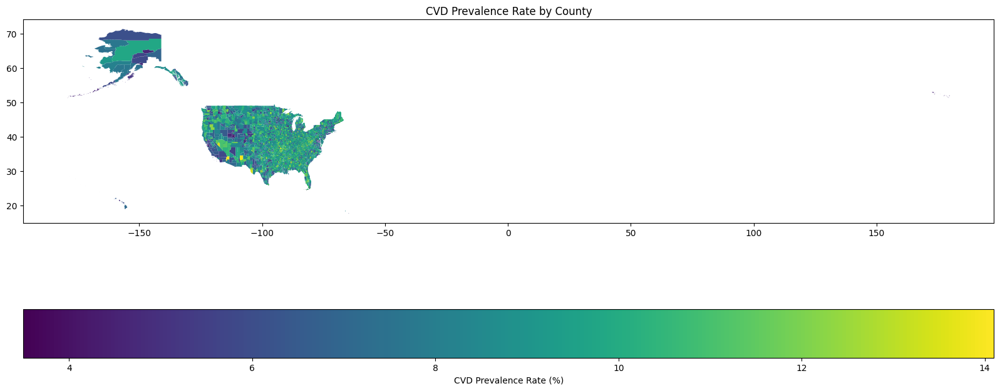

In [4]:
fig, ax = plt.subplots(1, 1, figsize=(20, 12))
merged.plot(column='CVD Prevalence Rate (%)', ax=ax, legend=True,
            legend_kwds={'label': 'CVD Prevalence Rate (%)', 'orientation': 'horizontal'})
plt.title('CVD Prevalence Rate by County')
# plt.show()


In [5]:
import plotly.express as px

df = px.data.gapminder().query("year==2007")

fig = px.scatter(df, x="gdpPercap", y="lifeExp", size="pop", color="continent",
                 hover_name="country", log_x=True, size_max=60)



simplified = merged.copy()
simplified['geometry'] = simplified['geometry'].simplify(
    tolerance=0.2)  # Adjust the tolerance to your needs

geojson = simplified.geometry.__geo_interface__


# Plot using Plotly Express
fig = px.choropleth(simplified,
                    geojson=geojson,
                    locations=simplified.index,
                    color="CVD Prevalence Rate (%)",
                    # This is the color scale, but you can choose another
                    color_continuous_scale="Viridis",
                    projection="mercator",  # This is the map projection
                    labels={
                        'CVD Prevalence Rate (%)': 'CVD Prevalence Rate (%)'}
                    )

# Adjust the map to fit the geographic data bounds
fig.update_geos(fitbounds="locations", visible=False)
# Removes the white margin around the map
fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
fig.show()

In [11]:
import pandas as pd

# Load the new CSV file
# Update this with the path to your new CSV file
new_csv_path = 'nhpi-alone_poverty-status_nhpi-below-poverty-past-year_2021_statecounty.csv'
new_df = pd.read_csv(new_csv_path)

# Load the CVD prevalence data
# Update this with the path to your CVD prevalence CSV file
cvd_csv_path = 'cvd_prev.csv'
cvd_df = pd.read_csv(cvd_csv_path)

# Prepare the CVD prevalence data for lookup
cvd_df['Location'] = cvd_df['Location'].str.replace(
    '_', ' ').str.replace(' County', '')

# Create a dictionary for mapping county names to CVD prevalence rates
cvd_prevalence_map = cvd_df.set_index(
    'Location')['CVD Prevalence Rate (%)'].to_dict()

# Define a function to replace the county name with its corresponding CVD prevalence rate


def replace_county_with_cvd(row):
    # Extract the county name, removing "County" and trimming spaces
    county_name = row['statecounty'].replace('County', '').strip()
    # Replace the county name with the CVD prevalence rate, if available
    return cvd_prevalence_map.get(county_name, row['statecounty'])


# Apply the function to the 'statecounty' column
new_df['statecounty'] = new_df.apply(replace_county_with_cvd, axis=1)

# Define the path for the modified file
modified_file_path = 'modified_file_with_cvd_prevalence.csv'

# Save the modified DataFrame to a new CSV file
new_df.to_csv(modified_file_path, index=False)

print(f"Modified file saved as {modified_file_path}")

Modified file saved as modified_file_with_cvd_prevalence.csv


ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed